### Importing Libraries

In [1]:
import os
import pandas as pd
import pickle
import shutil
import numpy as np
import seaborn as sns
from sklearn.datasets import load_files
import np_utils
import matplotlib.pyplot as plt
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential,Model
from keras.utils.vis_utils import plot_model
from keras.callbacks import ModelCheckpoint
from keras.utils import to_categorical
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score


from PIL import ImageFile   
from sklearn.model_selection import train_test_split
from keras.preprocessing import image                  
from tqdm import tqdm
from keras import optimizers
from keras.applications.vgg16 import VGG16

In [2]:
os.getcwd()

'C:\\Users\\Gunjan Joshi\\Documents\\Distracted Driver\\state-farm-distracted-driver-detection'

In [11]:
TEST_DIR = os.path.join(os.getcwd(),"imgs","test")
TRAIN_DIR = os.path.join(os.getcwd(),"imgs","train")
MODEL_PATH = os.path.join(os.getcwd(),"model","vgg16_fine_tuned")
PICKLE_PATH = os.path.join(os.getcwd(),"pickle")
TEST_CSV = os.path.join(os.getcwd(),"csv_files","test.csv")
TRAIN_CSV = os.path.join(os.getcwd(),"csv_files","train.csv")

In [4]:
if not os.path.exists(TEST_DIR):
    print("Testing data does not exists")
if not os.path.exists(TRAIN_DIR):
    print("Training data does not exists")
if not os.path.exists(MODEL_PATH):
    print("Model path does not exists")
    os.makedirs(MODEL_PATH)
    print("Model path created")
else:
    shutil.rmtree(MODEL_PATH)
    os.makedirs(MODEL_PATH)
if not os.path.exists(PICKLE_PATH):
    os.makedirs(PICKLE_PATH)

In [4]:
data_train = pd.read_csv(TRAIN_CSV)
data_test = pd.read_csv(TEST_CSV)

## Making Labels List for the Classes

In [6]:
labels_list = list(set(data_train['ClassName'].values.tolist()))
labels_id = {label_name:id for id,label_name in enumerate(labels_list)}
print(labels_id)
data_train['ClassName'].replace(labels_id,inplace=True)

labels = to_categorical(data_train['ClassName'])
print(labels.shape)

with open(os.path.join(PICKLE_PATH,"labels_list_vgg16_fine_tuned.pkl"),"wb") as handle:
    pickle.dump(labels_id,handle)
    

{'c5': 0, 'c1': 1, 'c3': 2, 'c0': 3, 'c2': 4, 'c8': 5, 'c9': 6, 'c7': 7, 'c6': 8, 'c4': 9}
(22424, 10)


#### Data Preprocessing

Convert the images to tensors, standardize and normalize them, set image size to 64x64 for model training

In [7]:
from PIL import ImageFile
from PIL import Image
ImageFile.LOAD_TRUNCATED_IMAGES = True   
xtrain,xtest,ytrain,ytest = train_test_split(data_train.iloc[:,0],labels,test_size = 0.2,random_state=42)
def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = Image.open(img_path)
    # Resize image to target size (e.g., 64x64)
    img = img.resize((64, 64))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = np.array(img)/255
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

train_tensors = paths_to_tensor(xtrain).astype('float32') - 0.5
valid_tensors = paths_to_tensor(xtest).astype('float32')- 0.5

100%|█████████████████████████████████████████████████████████████████████████████| 4485/4485 [00:14<00:00, 318.59it/s]


# MODEL ARCHITECTURE

Using transfer learning, VGG16 model and fine tuning it. Only including the convolutional block but not the classifier

In [8]:
model = VGG16(include_top=False)
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [14]:
model.output_shape[1:]

(None, None, 512)

### Fine tuned version

In [15]:
vgg16_model_fine_tuned = Sequential()
vgg16_model_fine_tuned.add(GlobalAveragePooling2D(input_shape=model.output_shape[1:]))
vgg16_model_fine_tuned.add(Dense(10, activation='softmax', kernel_initializer='glorot_normal'))
vgg16_model_fine_tuned = Model(inputs = model.input, outputs = vgg16_model_fine_tuned(model.output))

vgg16_model_fine_tuned.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

#### Freezing the first 10 layers so that we can use the initial weights that have been assigned and only train after the first 10 layers

In [16]:
for layer in vgg16_model_fine_tuned.layers[:10]:
    layer.trainable = False

In [17]:
vgg16_model_fine_tuned.compile(loss='categorical_crossentropy',optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),metrics=['accuracy'])

In [18]:
os.getcwd()

'C:\\Users\\Gunjan Joshi\\Documents\\Distracted Driver\\state-farm-distracted-driver-detection'

In [19]:
filepath = 'best_model_vgg.h5'   

In [20]:
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max',period=1)
callbacks_list = [checkpoint]
model_history = vgg16_model_fine_tuned.fit(train_tensors,ytrain,validation_data = (valid_tensors, ytest),epochs=25, batch_size=64, shuffle=True,callbacks=callbacks_list)

Epoch 1/25
281/281 [==============================] - ETA: 0s - loss: 1.6994 - accuracy: 0.4408
Epoch 1: val_accuracy improved from -inf to 0.80468, saving model to best_model_vgg.h5
281/281 [==============================] - 33s 85ms/step - loss: 1.6994 - accuracy: 0.4408 - val_loss: 0.7118 - val_accuracy: 0.8047
Epoch 2/25
281/281 [==============================] - ETA: 0s - loss: 0.4079 - accuracy: 0.8795
Epoch 2: val_accuracy improved from 0.80468 to 0.90368, saving model to best_model_vgg.h5
281/281 [==============================] - 26s 94ms/step - loss: 0.4079 - accuracy: 0.8795 - val_loss: 0.3292 - val_accuracy: 0.9037
Epoch 3/25
281/281 [==============================] - ETA: 0s - loss: 0.1895 - accuracy: 0.9486
Epoch 3: val_accuracy improved from 0.90368 to 0.96834, saving model to best_model_vgg.h5
281/281 [==============================] - 26s 93ms/step - loss: 0.1895 - accuracy: 0.9486 - val_loss: 0.1307 - val_accuracy: 0.9683
Epoch 4/25
281/281 [==========================

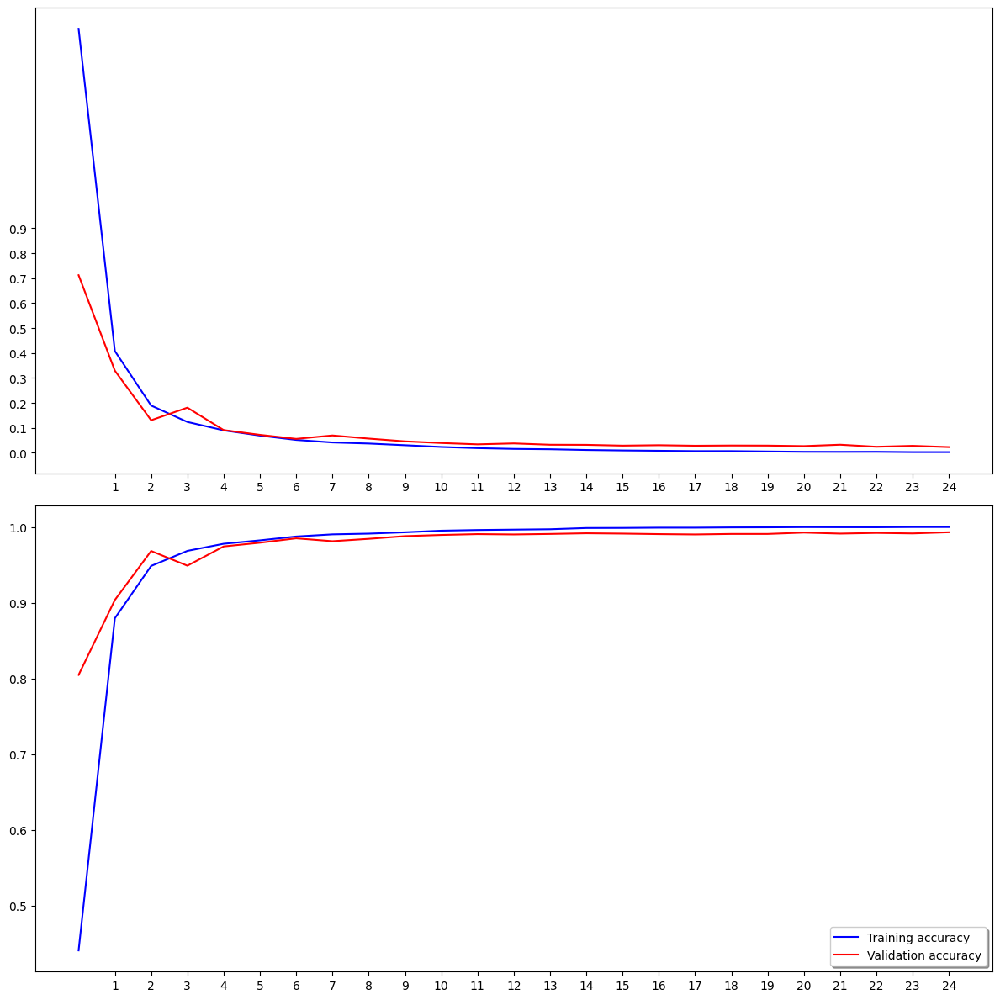

In [21]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(model_history.history['loss'], color='b', label="Training loss")
ax1.plot(model_history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, 25, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(model_history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(model_history.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, 25, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

# Model Analysis

Finding Precision,Recall and F1 score to analyse the fine tuned model created

In [31]:
accuracy = accuracy_score(ytest,ypred_class)
print('Accuracy: %f' % accuracy)
precision = precision_score(ytest, ypred_class,average='weighted')
print('Precision: %f' % precision)
recall = recall_score(ytest,ypred_class,average='weighted')
print('Recall: %f' % recall)
f1 = f1_score(ytest,ypred_class,average='weighted')
print('F1 score: %f' % f1)

Accuracy: 0.990858
Precision: 0.990961
Recall: 0.990858
F1 score: 0.990856


## Loading the best model to see its evaluation results on unseen data

In [5]:
from tensorflow.keras.models import load_model

best_model_path = 'best_model_vgg.h5'

# Load the model
model = load_model(best_model_path)


### Setting the class labels to the human readble and understanable form

In [6]:
class_labels = {
    0: 'operating the radio',
    1: 'texting - right',
    2: 'texting - left',
    3: 'safe driving',
    4: 'talking on the phone - right',
    5: 'hair and makeup',
    6: 'talking to passenger',
    7: 'reaching behind',
    8: 'drinking',
    9: 'talking on the phone - left'
}

1/1 [==============================] - 0s 18ms/step


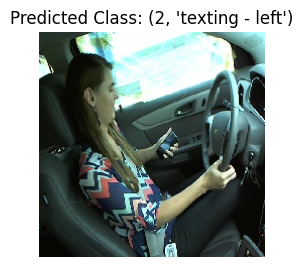

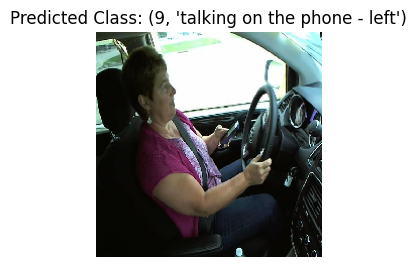

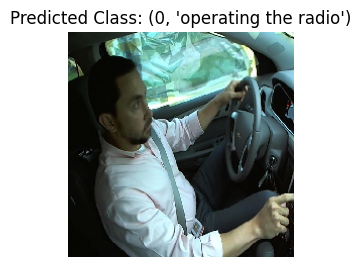

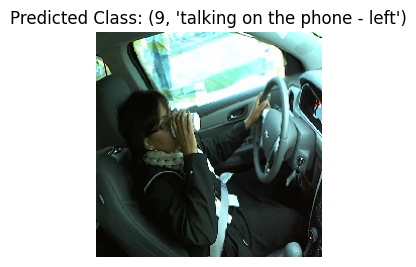

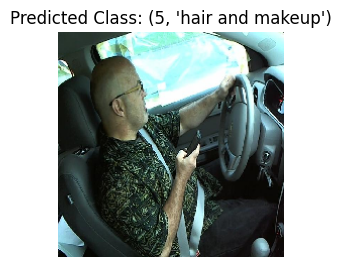

In [7]:
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Directory containing test images
# Select 5 random images from the test directory
selected_images = random.sample(os.listdir(TEST_DIR), 5)

# Preprocess and make predictions for each selected image
for image_name in selected_images:
    # Load and preprocess the image
    img_path = os.path.join(TEST_DIR, image_name)
    img = image.load_img(img_path, target_size=(64, 64))  
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize the image
    img_array = img_array.reshape((1, *img_array.shape))  # Add batch dimension

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)
    predicted_label = class_labels[predicted_class]

    img_vis = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size for visualization
    img_array_vis = image.img_to_array(img_vis)

    # Visualize the image and its predicted class
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img_vis)
    plt.title("Original Image")
    plt.axis('off')
    plt.title(f"Predicted Class: {predicted_class, predicted_label}")
    plt.axis('off')

plt.show()


The model performs well on images and identifying the class labels. The next step would be to see how it works with videos and classifies it.

### Working with video

In [23]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import tensorflow as tf
import numpy as np

In [24]:
def preprocess_frame(frame):
    frame = cv2.resize(frame, (64, 64))  # Example resizing
    frame = frame / 255.0  # Example normalization
    return frame

In [25]:
import os
os.getcwd()

'C:\\Users\\Gunjan Joshi\\Documents\\Distracted Driver\\state-farm-distracted-driver-detection'

In [26]:
video_path = 'input_video.mp4'
cap = cv2.VideoCapture(video_path)
frame_count = 0

1/1 [==============================] - 0s 19ms/step


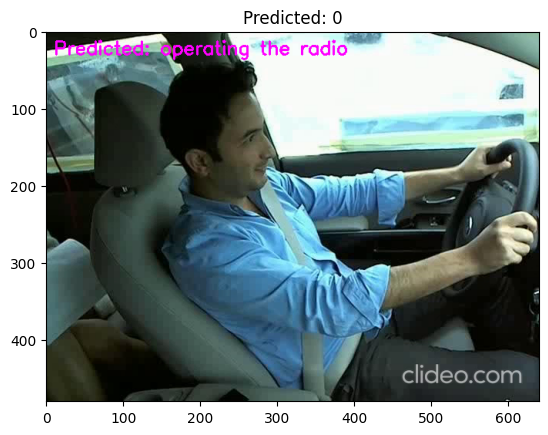

1/1 [==============================] - 0s 18ms/step


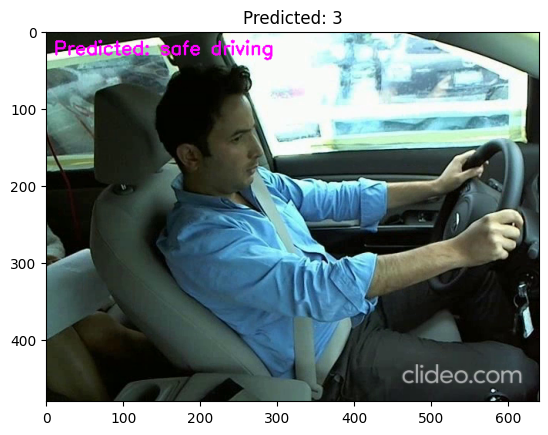

1/1 [==============================] - 0s 15ms/step


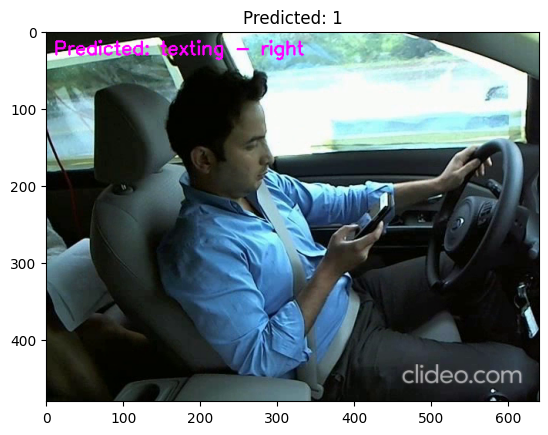

1/1 [==============================] - 0s 20ms/step


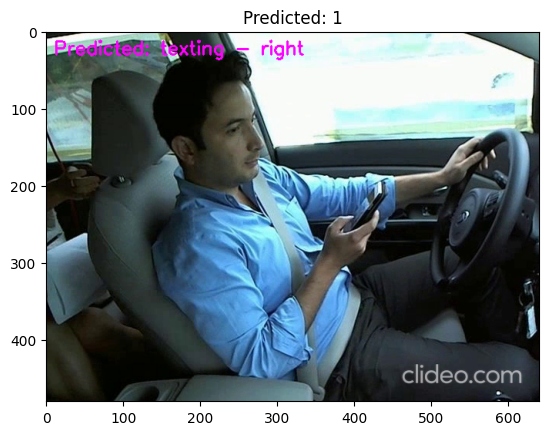

1/1 [==============================] - 0s 15ms/step


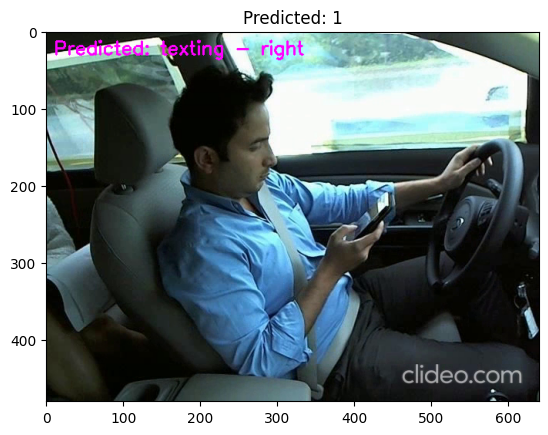

1/1 [==============================] - 0s 16ms/step


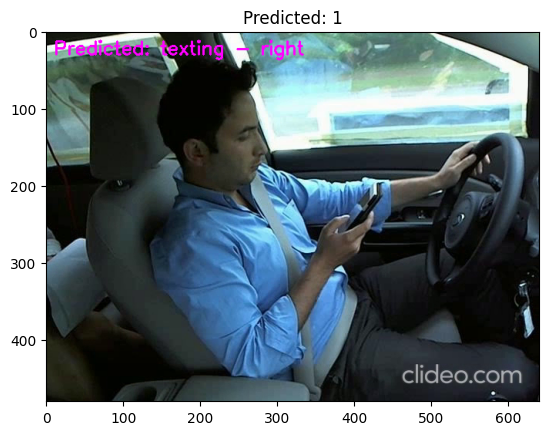

1/1 [==============================] - 0s 16ms/step


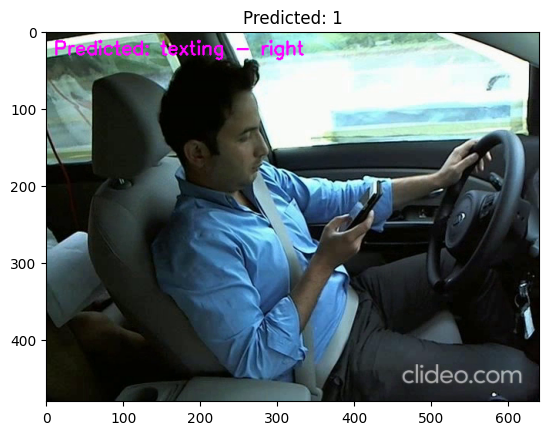

1/1 [==============================] - 0s 21ms/step


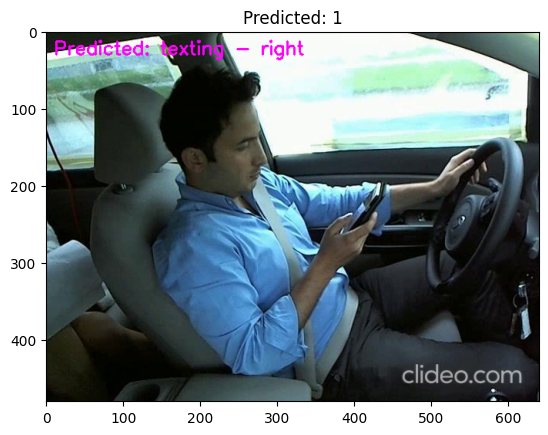

1/1 [==============================] - 0s 16ms/step


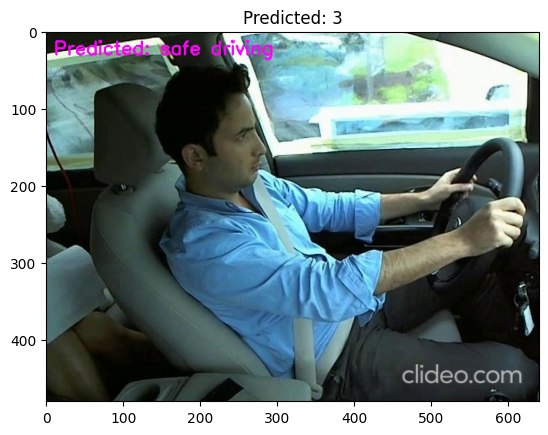

1/1 [==============================] - 0s 16ms/step


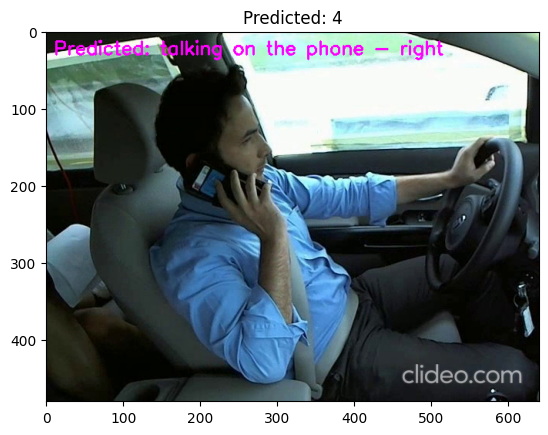

1/1 [==============================] - 0s 17ms/step


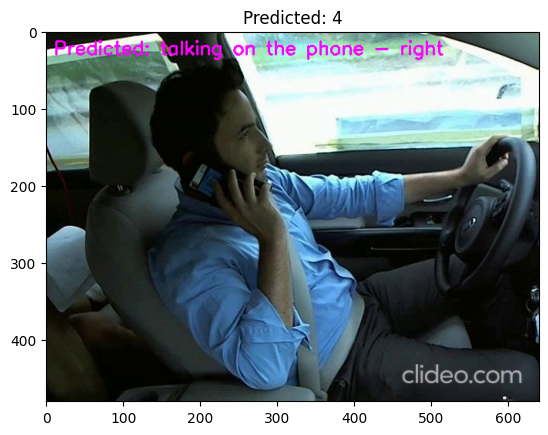

1/1 [==============================] - 0s 16ms/step


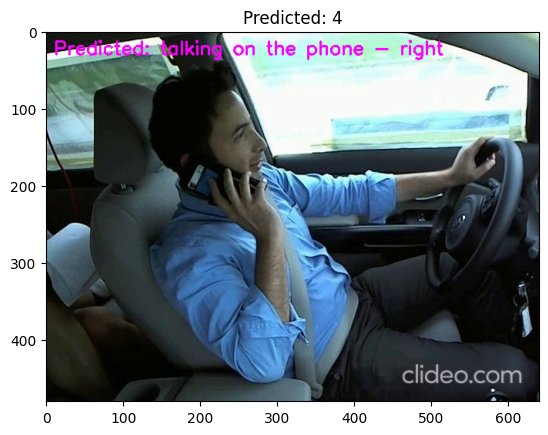

1/1 [==============================] - 0s 17ms/step


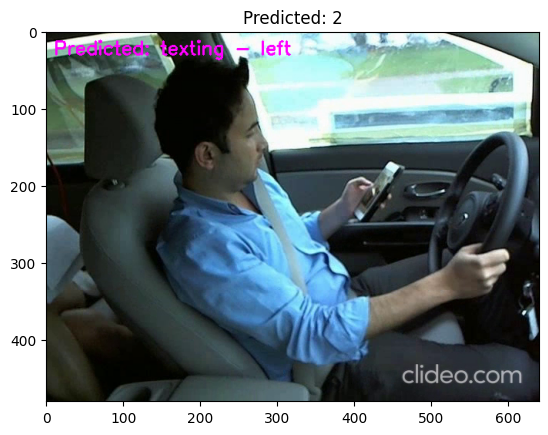

1/1 [==============================] - 0s 16ms/step


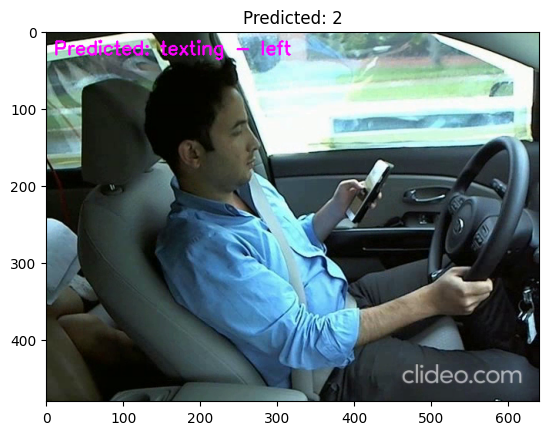

1/1 [==============================] - 0s 18ms/step


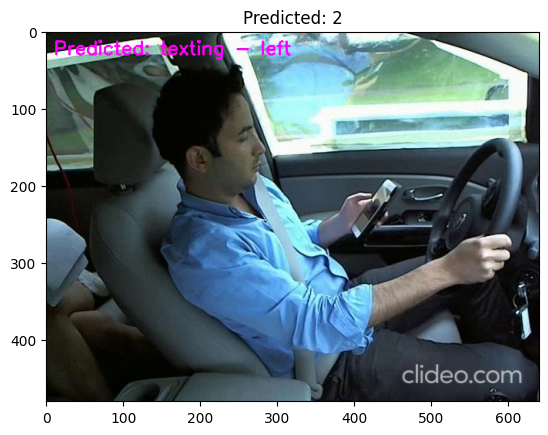

1/1 [==============================] - 0s 17ms/step


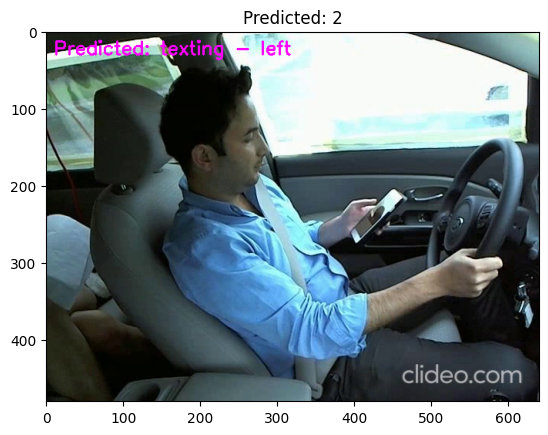

1/1 [==============================] - 0s 18ms/step


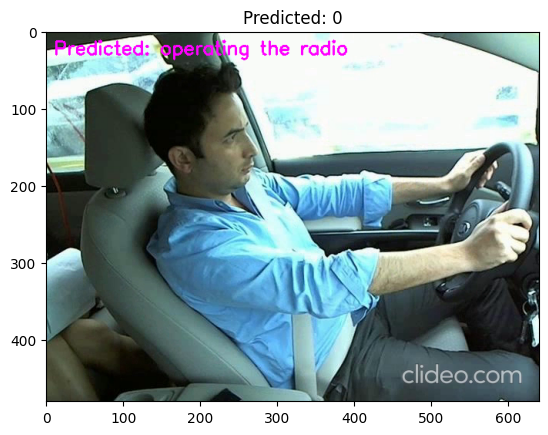

1/1 [==============================] - 0s 17ms/step


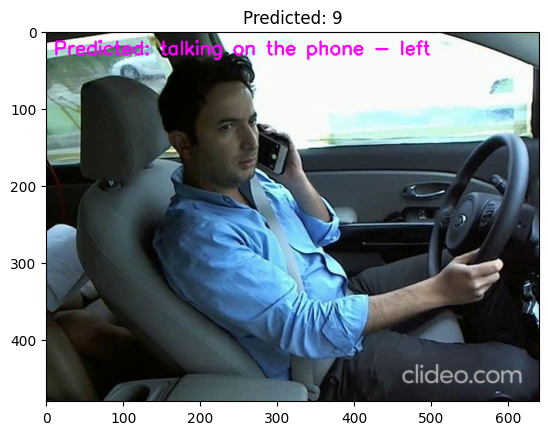

1/1 [==============================] - 0s 17ms/step


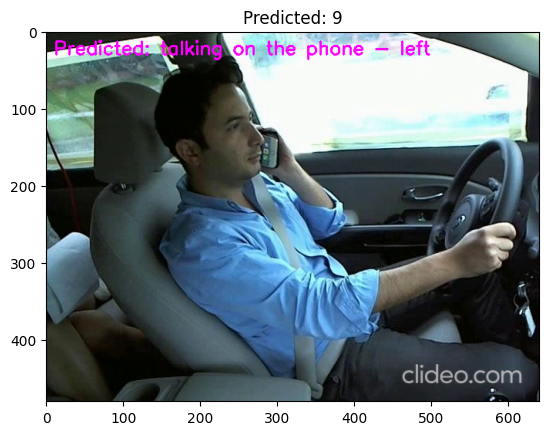

1/1 [==============================] - 0s 17ms/step


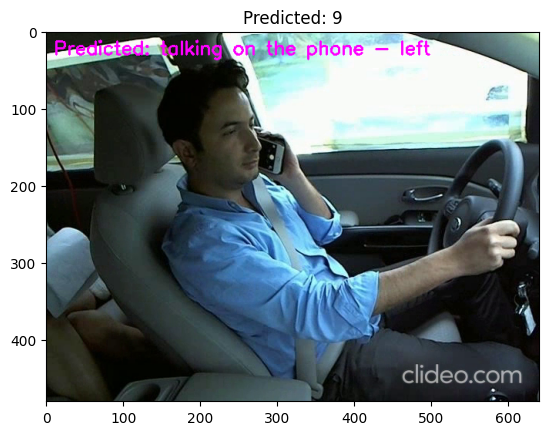

1/1 [==============================] - 0s 17ms/step


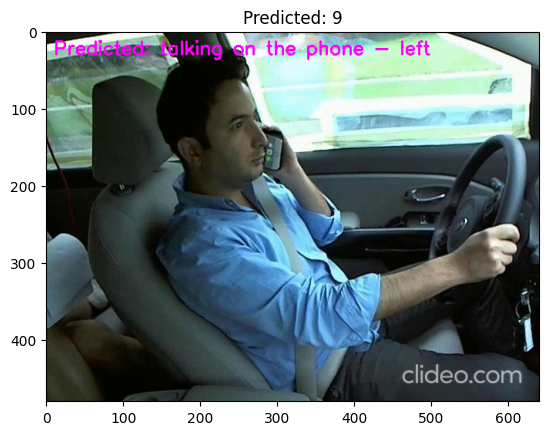

1/1 [==============================] - 0s 17ms/step


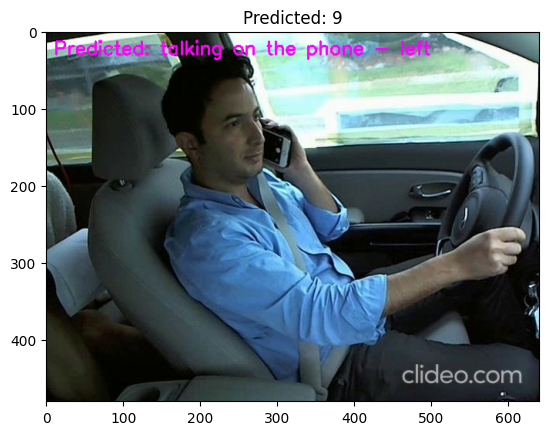

1/1 [==============================] - 0s 17ms/step


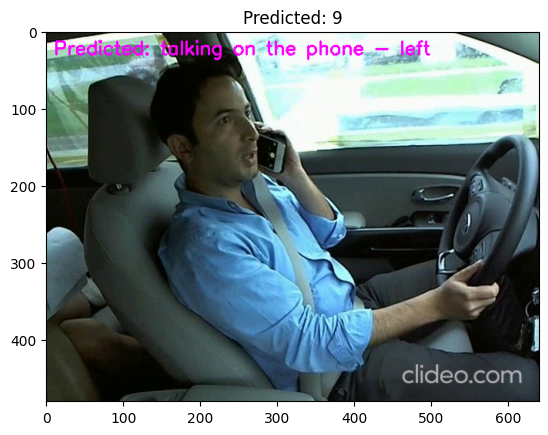

1/1 [==============================] - 0s 19ms/step


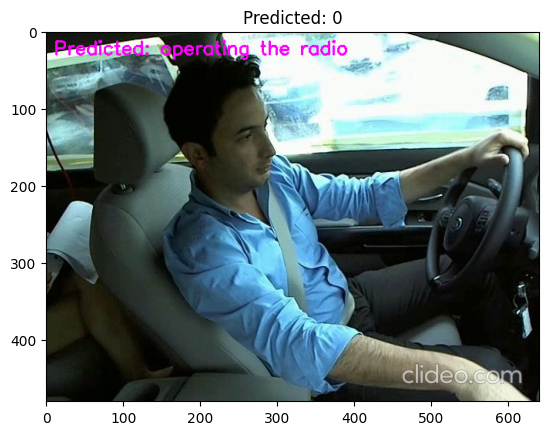

1/1 [==============================] - 0s 17ms/step


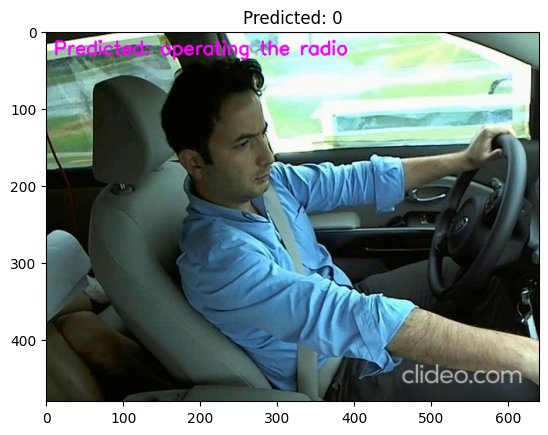

1/1 [==============================] - 0s 15ms/step


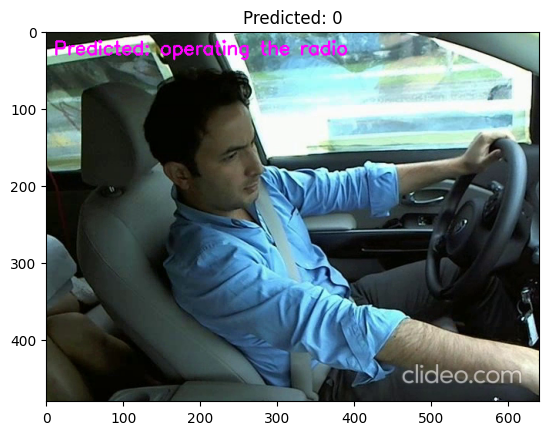

1/1 [==============================] - 0s 21ms/step


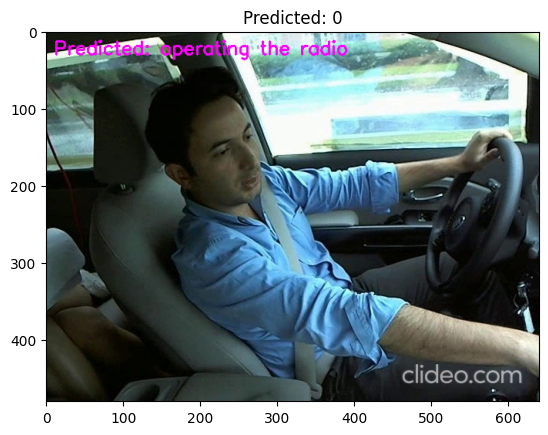

1/1 [==============================] - 0s 18ms/step


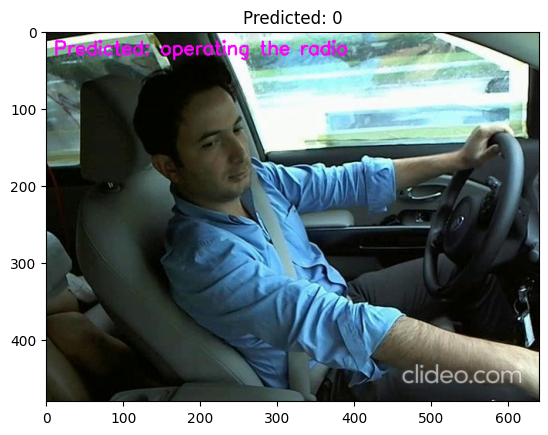

1/1 [==============================] - 0s 19ms/step


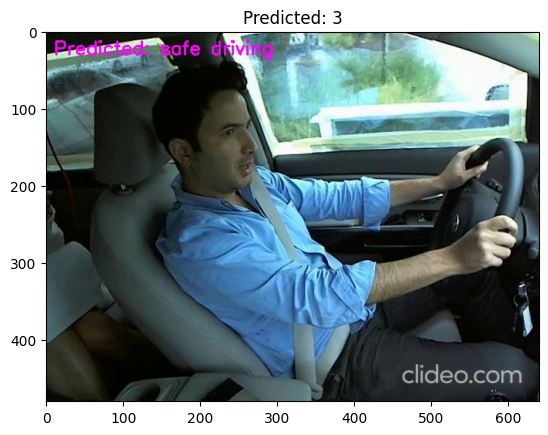

1/1 [==============================] - 0s 20ms/step


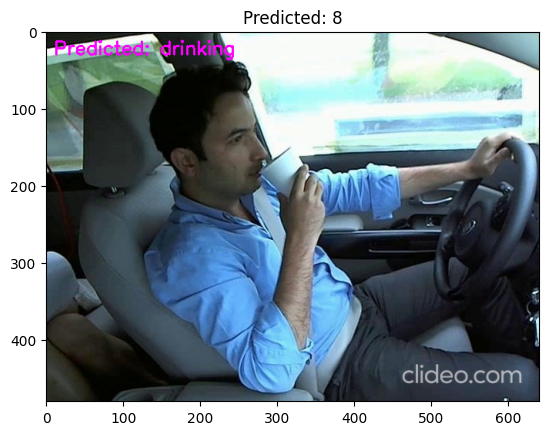

1/1 [==============================] - 0s 21ms/step


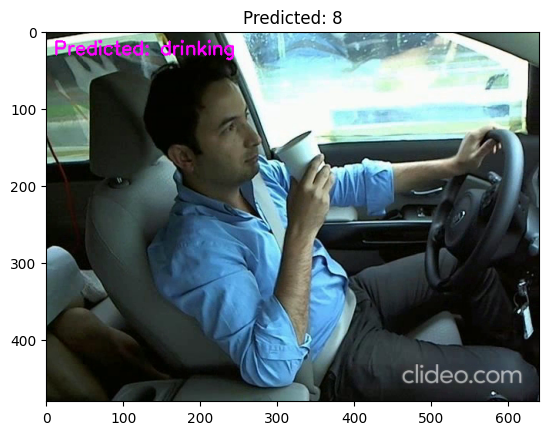

1/1 [==============================] - 0s 21ms/step


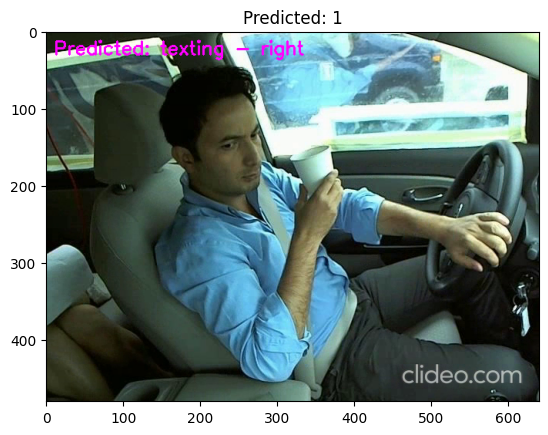

1/1 [==============================] - 0s 25ms/step


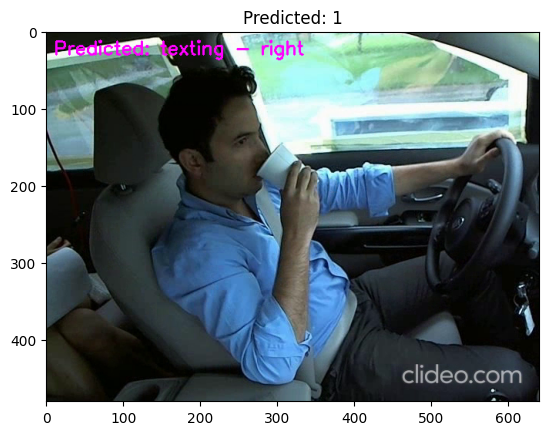

1/1 [==============================] - 0s 21ms/step


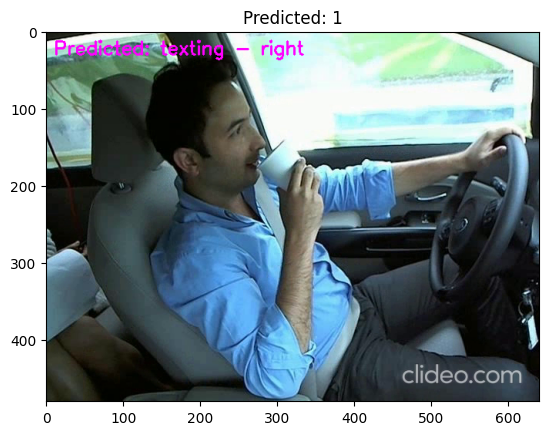

1/1 [==============================] - 0s 22ms/step


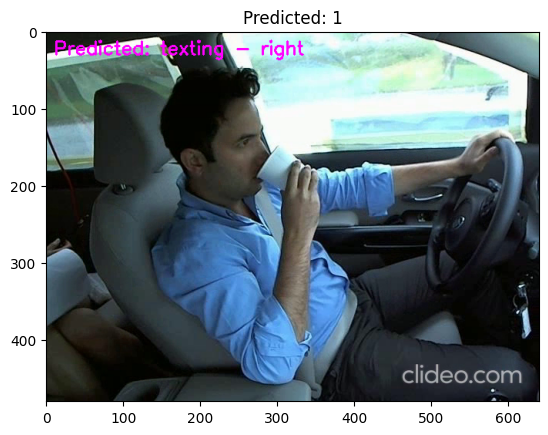

1/1 [==============================] - 0s 19ms/step


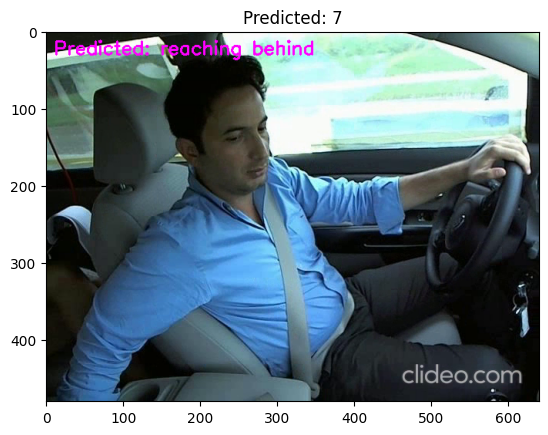

1/1 [==============================] - 0s 19ms/step


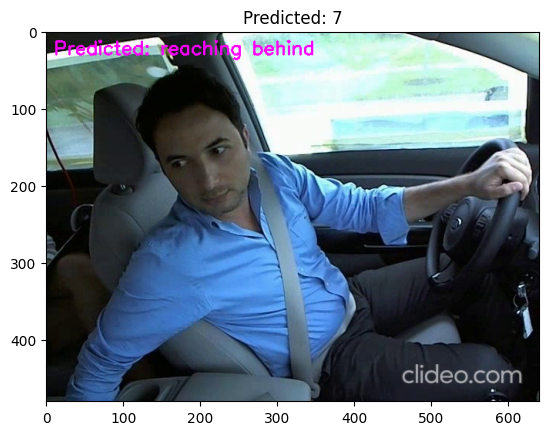

1/1 [==============================] - 0s 20ms/step


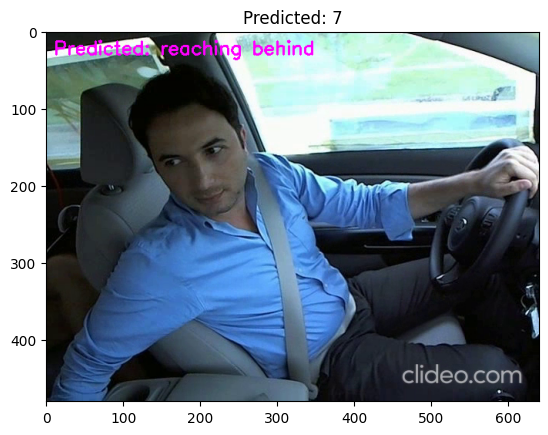

1/1 [==============================] - 0s 18ms/step


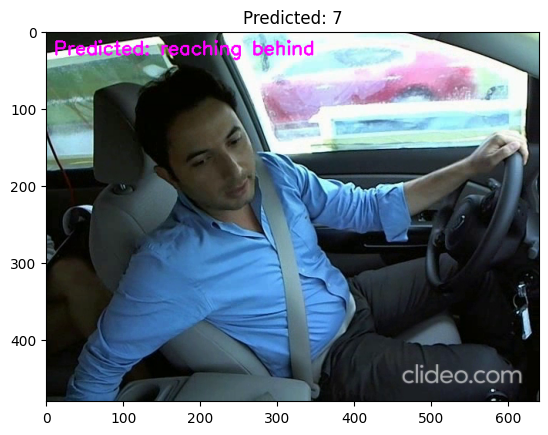

1/1 [==============================] - 0s 23ms/step


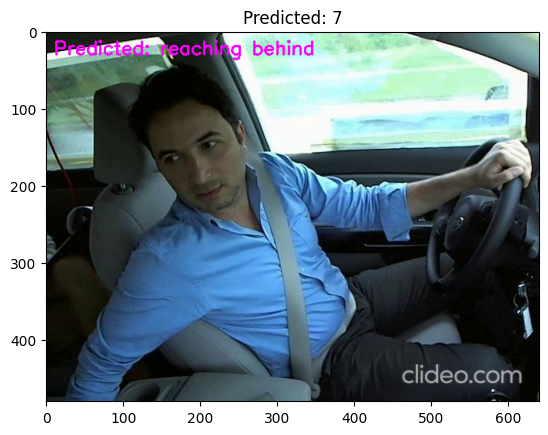

1/1 [==============================] - 0s 20ms/step


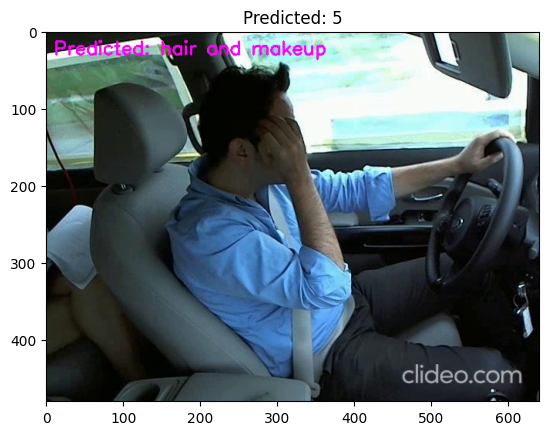

1/1 [==============================] - 0s 19ms/step


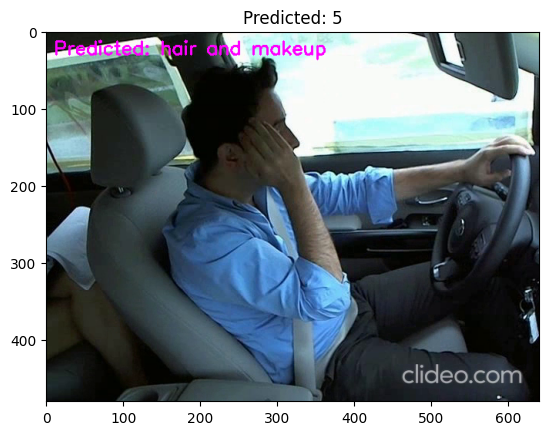

1/1 [==============================] - 0s 19ms/step


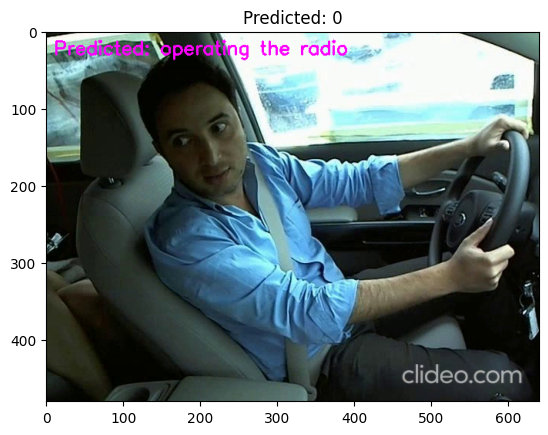

1/1 [==============================] - 0s 19ms/step


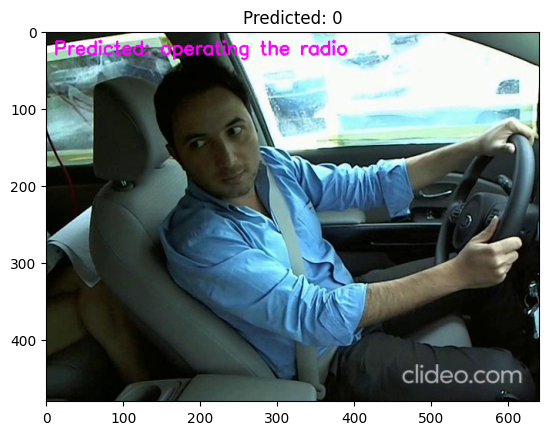

1/1 [==============================] - 0s 18ms/step


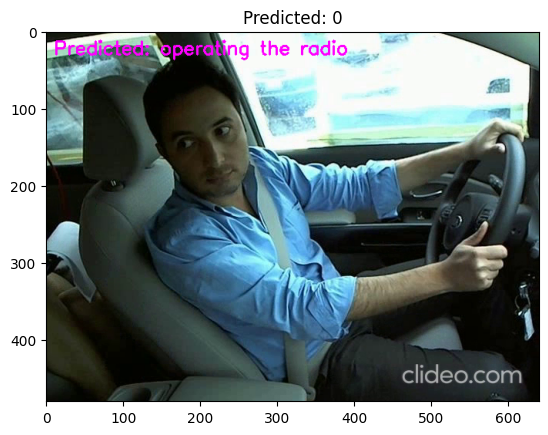

1/1 [==============================] - 0s 17ms/step


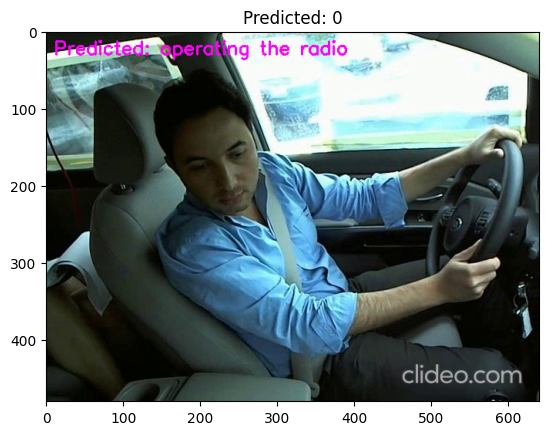

1/1 [==============================] - 0s 20ms/step


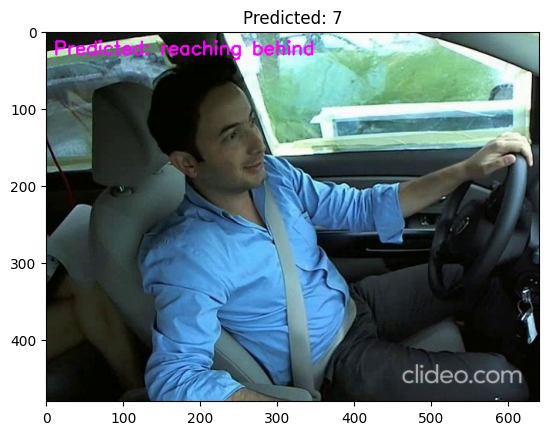

In [27]:
while True:
    ret, frame = cap.read()
    if not ret:
        break
        
    if frame_count % 10 == 0:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) 
        processed_frame = preprocess_frame(frame)
        output = model.predict(np.expand_dims(processed_frame, axis=0))
        top_class = np.argmax(output[0])  
        label = class_labels[top_class]
        # Overlay the prediction onto the frame
        cv2.putText(frame, f"Predicted: {label}", (10, 30), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 255), 2)
        
        plt.imshow(frame)
        plt.title(f"Predicted: {top_class}")
        plt.show() 
    
    frame_count += 1

    if cv2.waitKey(25) & 0xFF == ord('q'): 
        break

cap.release()